# Project Report (Canadian Community Well-Being Index)

## Introduction:

Across Canada, we are able to evaluate the socio-economic health of communities by using the Community Well-Being (CWB) Index, which provides a unique perspective through which we may do so<sup>[1]</sup>. The Community Well-Being Index (CWB Index) is a comprehensive score that serves to reflect the overall well-being of each community<sup>[2]</sup>. It does this by incorporating factors such as education, income, labour force activity, and housing values. In addition to facilitating comparisons between communities of First Nations and Inuit, these scores also allow for comparisons to be made against a more general Canadian context.

Our [dataset](https://open.canada.ca/data/en/dataset/56578f58-a775-44ea-9cc5-9bf7c78410e6) originates from Indigenous Services Canada. **How do these socio-economic factors influence CWB scores, and what can they reveal about community health disparities?** This is the question that our research investigates as we investigate the predictive power of these factors. The purpose of this project is to disentangle the intricate connections that exist between these indicators and the well-being of the community by making use of data obtained from the Census of Population conducted by Statistics Canada. The findings of this project could provide valuable insights that could be used to guide policy and intervention strategies. 


## Preliminary Exploratory Data Analysis
Note that we have imported and built up the data frame and some function in the Jupyter notebook, here are our steps.

### Importing Packages

Before we look at the dataset, we need to first import the essential packages for data manipulation (`dplyr`, `tidyr`), visualization (`ggplot2`, `GGally`,`cowplot`), and modeling (`tidymodels`, `kknn`). These packages provide a comprehensive toolkit for data analysis, from preprocessing to complex model building.



In [1]:
library(tidyverse)
library(repr)
library(tidymodels)
library(ISLR)
library(cowplot)
library(GGally)
library(kknn)

── Attaching packages ─────────────────────────────────────── tidyverse 1.3.2 ──
✔ ggplot2 3.5.0     ✔ purrr   1.0.1
✔ tibble  3.2.1     ✔ dplyr   1.1.1
✔ tidyr   1.3.0     ✔ stringr 1.5.0
✔ readr   2.1.3     ✔ forcats 0.5.2
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
── Attaching packages ────────────────────────────────────── tidymodels 1.0.0 ──

✔ broom        1.0.2     ✔ rsample      1.1.1
✔ dials        1.1.0     ✔ tune         1.0.1
✔ infer        1.0.4     ✔ workflows    1.1.2
✔ modeldata    1.0.1     ✔ workflowsets 1.0.0
✔ parsnip      1.0.3     ✔ yardstick    1.1.0
✔ recipes      1.0.4     

── Conflicts ───────────────────────────────────────── tidymodels_conflicts() ──
✖ scales::discard() masks purrr::discard()
✖ dplyr::filter()   masks stats::filter()
✖ recipes::fixed()  masks stringr::fixed()
✖ dplyr::lag()      masks stats::lag()
✖ yardstick::spec() masks read

### Reading Dataset

We have stored the dataset into a csv file, and import the file into Jupyter Notebook for analysis. We directly used the function `read_csv` to view the csv file downloaded.

Some of the observations are not including certain information, therefore, we use function `filter` to exclude rows with NA values in key columns beforing actually analyzing and obtain a clean data frame, ensuring the dataset's integrity for analysis.

In [2]:
raw_data <- read_csv("CWB_2021.csv")

database <- raw_data |>
            filter(Census_Population_2021 != "NA") |>
            filter(Income_2021 != "NA") |>
            filter(Education_2021 != "NA") |>
            filter(Housing_2021 != "NA") |>
            filter(Labour_Force_Activity_2021 != "NA") |>
            filter(CWB_2021 != "NA")

head(database)

Rows: 5161 Columns: 9
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (2): CSD_Name_2021, Community_Type_2021
dbl (7): CSD_Code_2021, Census_Population_2021, Income_2021, Education_2021,...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


CSD_Code_2021,CSD_Name_2021,Census_Population_2021,Income_2021,Education_2021,Housing_2021,Labour_Force_Activity_2021,CWB_2021,Community_Type_2021
<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
1001113,Trepassey,405,76,48,97,70,73,Non-Indigenous Community
1001124,"Division No. 1, Subd. U",1373,81,63,98,77,80,Non-Indigenous Community
1001126,Cape Broyle,499,78,57,97,74,77,Non-Indigenous Community
1001131,Renews-Cappahayden,280,79,59,94,72,76,Non-Indigenous Community
1001149,Ferryland,371,83,56,96,68,76,Non-Indigenous Community
1001155,"Division No. 1, Subd. W",469,78,58,99,69,76,Non-Indigenous Community


## Visualization of Data

Now the first several rows of the data has been shown, and it seems well-organized and tidy. Since the goal is to predict the CWB index by 4 predictors below, we need to have a glance at each of the variables for a deeper insight.

- Income: The average income level in 2021. Higher income levels are typically associated with better access to resources and may positively influence the CWB score.
- Education: The average education level attained. Education is often linked to better socioeconomic outcomes and may be a strong predictor of CWB.
- Housing: The average housing quality or status. Adequate housing is a critical component of well-being, affecting both physical and mental health.
- Labour force: The level of employment or labor force participation. Higher labor force activity might correlate with higher economic productivity and, consequently, higher CWB scores.

The data was first split into training and testing sets so that the model could be validated. Then we made histograms and summary statistics to see how 4 variables are spread out. These insights help choose the features of the model.

In [3]:
set.seed(1234)
options(repr.plot.width=6, repr.plot.height=5)
# splitting data into training data and testing data
database_split <- initial_split(database, prop = 0.75,strata = CSD_Code_2021)
database_train <- training(database_split)
database_test <- testing(database_split)

### Viewing the entire database

Next, we decide to create a plot for the entire database, this plot involves all 4 predictors and the response variable CWB index. Specifically, we used multiple lines in the plot to indicate the counts of different variables in different levels (or values). Each line of different colour represents one of the variable in the data. By looking at the plot, we can easily find potential relationships between predictors and the response variable, as well as what does the entire data look like.

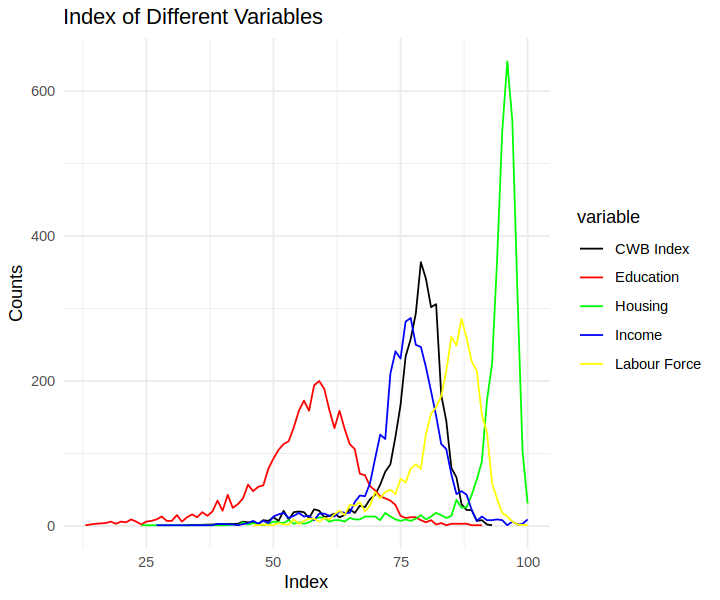

In [4]:
# count different income levels
count_income <- database |>
             group_by(Income_2021) |>
             summarize(count = n())

# count different education levels
count_edu <- database |>
             group_by(Education_2021) |>
             summarize(count = n())


# count different labour force levels
count_labour <- database |>
             group_by(Labour_Force_Activity_2021) |>
             summarize(count = n())


# count different house levels
count_house <- database |>
             group_by(Housing_2021) |>
             summarize(count = n())

count_cwb <- database |>
             group_by(CWB_2021) |>
             summarize(count = n())

count_income$variable <- 'Income'
count_edu$variable <- 'Education'
count_labour$variable <- 'Labour Force'
count_house$variable <- 'Housing'
count_cwb$variable <- 'CWB Index'

# Combine all datasets into one dataframe for plotting
# Note that we need to rename the 'Income_2021', 'Education_2021', etc. columns to a common name
count_income <- count_income |> rename(Index = Income_2021)
count_edu <- count_edu |> rename(Index = Education_2021)
count_labour <- count_labour |> rename(Index = Labour_Force_Activity_2021)
count_house <- count_house |> rename(Index = Housing_2021)
count_cwb <- count_cwb |> rename(Index = CWB_2021)

# Combine the data
all_data <- bind_rows(count_income, count_edu, 
                      count_labour, count_house, count_cwb)

# Plot with a single ggplot call, which will create a legend automatically
plot_all <- ggplot(all_data, aes(x = Index, y = count, color = variable)) +
  geom_line() +  # The line color will be set by the 'variable' column
  xlab("Index") +
  ylab("Counts") +
  ggtitle("Index of Different Variables") +
  scale_color_manual(values = c('Income' = "blue", 'Education' = "red", 
                                'Labour Force' = "yellow", 'Housing' = "green", 'CWB Index' = "black")) +
  theme_minimal()

plot_all

By looking at the plot, we see that all the predictors and the response variable forms a normal distribution, with mean between 50 - 100. Since the distribution of CWB index is right in the middle of all other variable, it might be possible that CWB index is actually the mean of all other variables.

### Viewing the Mean

Below, we looked at the mean value of the four predictors and the response variable.

In [5]:
#count the average value of variables
group_mean <- database |>
      summarize(across(Income_2021:CWB_2021, mean)) 

print("Table 3: Mean values across Income, Education, Housing, Labour Force and CWB Index")
head(group_mean)

[1] "Table 3: Mean values across Income, Education, Housing, Labour Force and CWB Index"


Income_2021,Education_2021,Housing_2021,Labour_Force_Activity_2021,CWB_2021
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
75.93084,56.52808,92.37566,82.96293,76.95048


The mean values of the key variables were found. The average house score was 92.38, the average education score was 56.53, the average income score was 75.93, the average work force activity score was 82.96, and the CWB Index has an average of 76.95. These averages give us a basic idea of the socioeconomic status of the people in our dataset, and they will be used to look into their connection with the CWB score in more detail. Moreover, we are more confident that the CWB Index is calculated by taking the average or all other variables.

### Viewing the Difference between Communities

Since we have neglected the type of communities in our predictors, it is essential to take them into account. Here is the type of communities we found in the data: 

In [6]:
# Assuming your dataset is named 'data'
unique_communities <- unique(database$Community_Type_2021)

# Print unique community types
print(unique_communities)

# Count the number of different community types
num_unique_communities <- length(unique_communities)
print(paste("Number of different community types:", num_unique_communities))

[1] "Non-Indigenous Community" "First Nations Community" 
[3] "Inuit Community"         
[1] "Number of different community types: 3"


By splitting the data into different parts, each have one type of community, we generated a plot of counts of different variables just like what we did in the previous plot. Then we can compare the life in different communities.

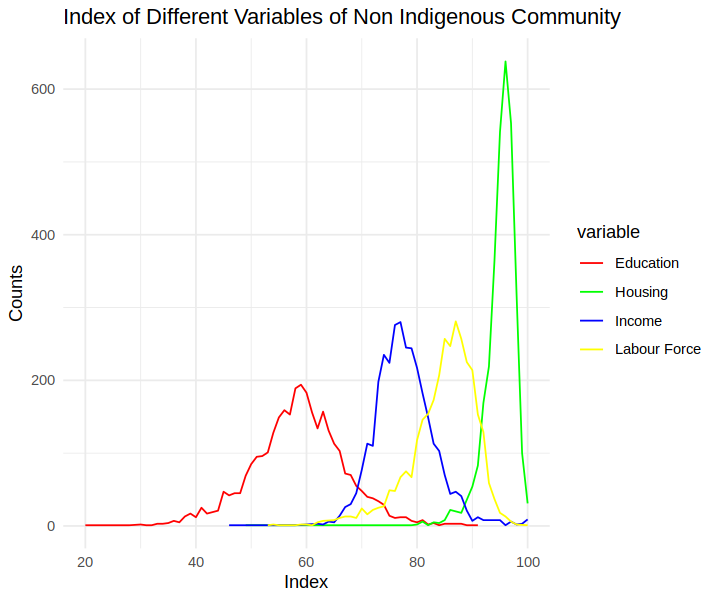

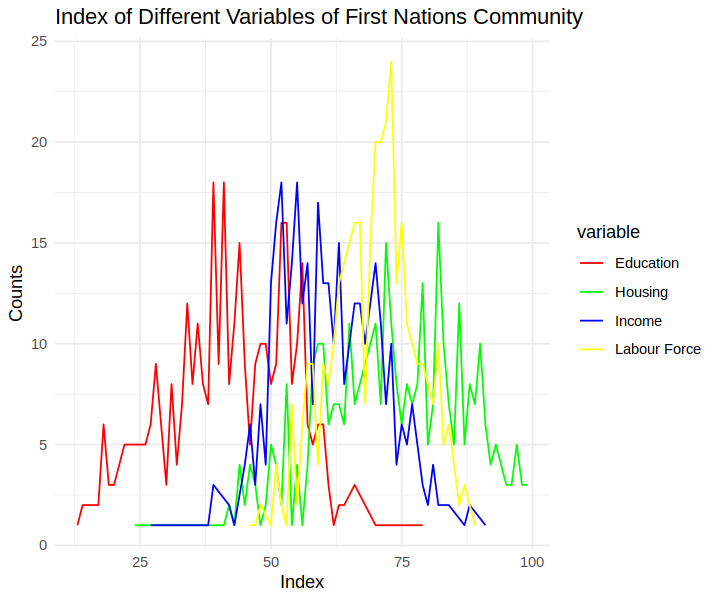

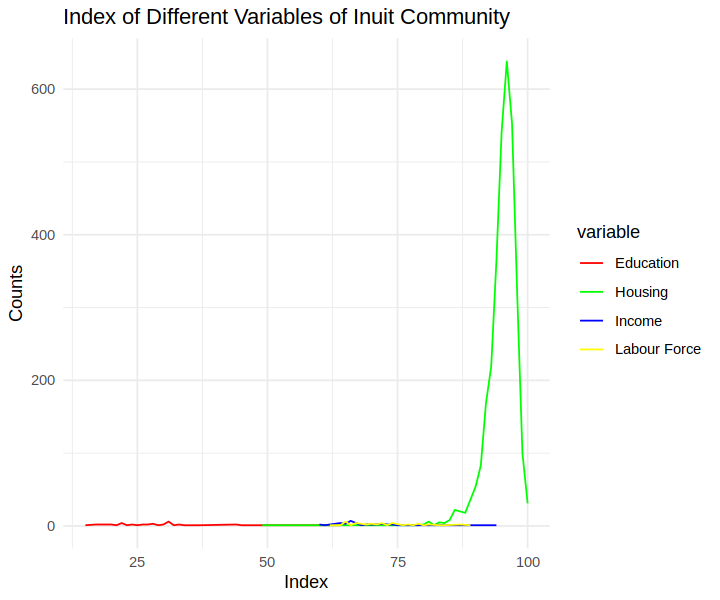

In [7]:
# split the database

non_indigenous <- database[database$Community_Type_2021 == "Non-Indigenous Community",]
first_nations <- database[database$Community_Type_2021 == "First Nations Community",]
inuit <- database[database$Community_Type_2021 == "Inuit Community",]

#count the average value of variables
non_indigenous_inc <- non_indigenous |>
               group_by(Income_2021) |>
               summarize(count = n()) 

non_indigenous_edu <- non_indigenous |>
                      group_by(Education_2021) |>
                      summarize(count = n())

# count different labour force levels
non_indigenous_labour <- non_indigenous |>
                         group_by(Labour_Force_Activity_2021) |>
                         summarize(count = n())

# count different house levels
non_indigenous_house <- non_indigenous |>
                        group_by(Housing_2021) |>
                        summarize(count = n())

non_indigenous_inc$variable <- 'Income'
non_indigenous_edu$variable <- 'Education'
non_indigenous_labour$variable <- 'Labour Force'
non_indigenous_house$variable <- 'Housing'

# Combine all datasets into one dataframe for plotting
# Note that we need to rename the 'Income_2021', 'Education_2021', etc. columns to a common name
non_indigenous_inc <- non_indigenous_inc |> rename(Index = Income_2021)
non_indigenous_edu <- non_indigenous_edu |> rename(Index = Education_2021)
non_indigenous_labour <- non_indigenous_labour |> rename(Index = Labour_Force_Activity_2021)
non_indigenous_house <- non_indigenous_house |> rename(Index = Housing_2021)

# Combine the data
all_data_1 <- bind_rows(non_indigenous_inc, non_indigenous_edu, 
                      non_indigenous_labour, non_indigenous_house)

# Plot with a single ggplot call, which will create a legend automatically
plot_non_ind <- ggplot(all_data_1, aes(x = Index, y = count, color = variable)) +
  geom_line() +  # The line color will be set by the 'variable' column
  xlab("Index") +
  ylab("Counts") +
  ggtitle("Index of Different Variables of Non Indigenous Community") +
  scale_color_manual(values = c('Income' = "blue", 'Education' = "red", 
                                'Labour Force' = "yellow", 'Housing' = "green")) +
  theme_minimal()

plot_non_ind


#count the average value of variables
first_nations_inc <- first_nations |>
               group_by(Income_2021) |>
               summarize(count = n()) 

first_nations_edu <- first_nations |>
                      group_by(Education_2021) |>
                      summarize(count = n())

# count different labour force levels
first_nations_labour <- first_nations |>
                         group_by(Labour_Force_Activity_2021) |>
                         summarize(count = n())

# count different house levels
first_nations_house <- first_nations |>
                        group_by(Housing_2021) |>
                        summarize(count = n())

first_nations_inc$variable <- 'Income'
first_nations_edu$variable <- 'Education'
first_nations_labour$variable <- 'Labour Force'
first_nations_house$variable <- 'Housing'

first_nations_inc <- first_nations_inc |> rename(Index = Income_2021)
first_nations_edu <- first_nations_edu |> rename(Index = Education_2021)
first_nations_labour <- first_nations_labour |> rename(Index = Labour_Force_Activity_2021)
first_nations_house <- first_nations_house |> rename(Index = Housing_2021)

all_data_2 <- bind_rows(first_nations_inc, first_nations_edu, 
                      first_nations_labour, first_nations_house)

# Plot with a single ggplot call, which will create a legend automatically
plot_first_na <- ggplot(all_data_2, aes(x = Index, y = count, color = variable)) +
  geom_line() +  # The line color will be set by the 'variable' column
  xlab("Index") +
  ylab("Counts") +
  ggtitle("Index of Different Variables of First Nations Community") +
  scale_color_manual(values = c('Income' = "blue", 'Education' = "red", 
                                'Labour Force' = "yellow", 'Housing' = "green")) +
  theme_minimal()

plot_first_na


#count the average value of variables
inuit_inc <- inuit |>
             group_by(Income_2021) |>
             summarize(count = n()) 

inuit_edu <- inuit |>
             group_by(Education_2021) |>
             summarize(count = n())

# count different labour force levels
inuit_labour <- inuit |>
                group_by(Labour_Force_Activity_2021) |>
                summarize(count = n())

# count different house levels
inuit_house <- non_indigenous |>
               group_by(Housing_2021) |>
               summarize(count = n())


inuit_inc$variable <- 'Income'
inuit_edu$variable <- 'Education'
inuit_labour$variable <- 'Labour Force'
inuit_house$variable <- 'Housing'

inuit_inc <- inuit_inc |> rename(Index = Income_2021)
inuit_edu <- inuit_edu |> rename(Index = Education_2021)
inuit_labour <- inuit_labour |> rename(Index = Labour_Force_Activity_2021)
inuit_house <- inuit_house |> rename(Index = Housing_2021)

all_data_3 <- bind_rows(inuit_inc, inuit_edu, inuit_labour, inuit_house)

# Plot with a single ggplot call, which will create a legend automatically
plot_inuit <- ggplot(all_data_3, aes(x = Index, y = count, color = variable)) +
  geom_line() +  # The line color will be set by the 'variable' column
  xlab("Index") +
  ylab("Counts") +
  ggtitle("Index of Different Variables of Inuit Community") +
  scale_color_manual(values = c('Income' = "blue", 'Education' = "red", 
                                'Labour Force' = "yellow", 'Housing' = "green")) +
  theme_minimal()

plot_inuit

It seems like the quality of first nation people' lives is a bit lower than non-indigenous people's since the distribution of variables in first nation's plot is shows a lower mean. We did not clearly see the data in the inuit plot since there are only a few data points, all we see is their housing index is very high.

Since the first nation and inuit communities both have a few data points, even if there is a small difference between communities, we can nearly neglect the difference when creating the predicting model.

## General Relationship


We use `ggpairs` from the `GGally` package to see how key variables are distributed and how they are related to each other. This gives us a full picture of possible linear correlations and points out any outliers or strange patterns.

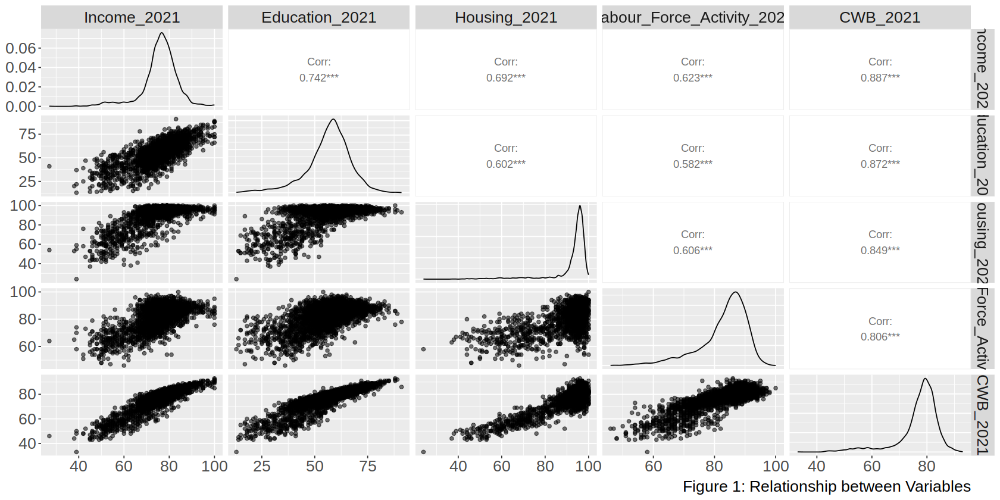

In [8]:
# Select and mutate to obtain a clean data frame, and only see variables we are insterested
database_train_selected <- database |>
                           select(Income_2021:CWB_2021) 

# Use ggpair to draw plots of relationship between variables
options(repr.plot.width = 14, repr.plot.height = 7)
graph <- database_train_selected |>
         ggpairs(mapping = aes(alpha = 0.4)) +
        labs(caption = "Figure 1: Relationship between Variables") +
         theme(text = element_text(size = 20))
graph

Observation: The graphs show that all 4 predictors have strong linear relationships with the CWB score, and the correlation coefficients show that these relationships are very strong.



## KNN Multi-Variable Regression Model

Now we begin building our KNN regression model. We tune the model with cross-validation to find the ideal K value.

- We first define a recipe with the 4 predictors we choose. We further scale and center our predictors using `step_scale()`.
- We then define the specification for our k-NN model using `weight_func = "rectangular"`. We set the K as a tunable parameter `tune()`, because we want to find the best value for the number of neighbors (k) by trying out different values.
- Then, we perform cross-validation with 5 folds. This approach splits the dataset into 5 parts, using 4 of them for training and the remaining one for validation in each iteration.
- We create a tibble named `gridvals` which contains a sequence of numbers from 1 to 200 with interval 3, used as different values for k.
- Next, we combine the recipe and the model specification in a workflow. Apply the `tune_grid()` to perform a grid search over the different values of k. And collect the metrics from the tuning process, specifically focusing on accuracy.
- Finally, our result contains the accuracies for different values of k (number of neighbors) and can be used for further analysis or visualization to determine the best k-value for the model.

The RMSE was used as the metric to evaluate the model performance. We aimed to minimize this value, indicating a better fit of the model to the data.

In [9]:
knn_recipe <- recipe(CWB_2021 ~ Income_2021 +  Education_2021 + Housing_2021 + Labour_Force_Activity_2021, 
                     data = database_train) |>
                     step_scale(all_predictors()) |>
                     step_center(all_predictors())

knn_spec <- nearest_neighbor(weight_func = "rectangular",
                              neighbors = tune()) |>
  set_engine("kknn") |>
  set_mode("regression")

knn_vfold <- vfold_cv(database_train, v = 5, strata = CWB_2021)

knn_wkflw <- workflow() |>
  add_recipe(knn_recipe) |>
  add_model(knn_spec)

knn_wkflw

gridvals <- tibble(neighbors = seq(from = 1, to = 200, by = 3))

knn_results <- knn_wkflw |>
  tune_grid(resamples = knn_vfold, grid = gridvals) |>
  collect_metrics() |>
  filter(.metric == "rmse")

# show the results
knn_results

# show only the row of minimum RMSPE
knn_min <- knn_results |>
  filter(mean == min(mean))
knn_min

══ Workflow ════════════════════════════════════════════════════════════════════
Preprocessor: Recipe
Model: nearest_neighbor()

── Preprocessor ────────────────────────────────────────────────────────────────
2 Recipe Steps

• step_scale()
• step_center()

── Model ───────────────────────────────────────────────────────────────────────
K-Nearest Neighbor Model Specification (regression)

Main Arguments:
  neighbors = tune()
  weight_func = rectangular

Computational engine: kknn 


neighbors,.metric,.estimator,mean,n,std_err,.config
<dbl>,<chr>,<chr>,<dbl>,<int>,<dbl>,<chr>
1,rmse,standard,0.8637710,5,0.02545638,Preprocessor1_Model01
4,rmse,standard,0.6454197,5,0.03252034,Preprocessor1_Model02
7,rmse,standard,0.6497493,5,0.02863803,Preprocessor1_Model03
10,rmse,standard,0.6693779,5,0.02709557,Preprocessor1_Model04
13,rmse,standard,0.6776773,5,0.02577301,Preprocessor1_Model05
16,rmse,standard,0.6970824,5,0.02500229,Preprocessor1_Model06
19,rmse,standard,0.7114289,5,0.02843430,Preprocessor1_Model07
22,rmse,standard,0.7309730,5,0.03004652,Preprocessor1_Model08
25,rmse,standard,0.7523338,5,0.03316596,Preprocessor1_Model09


neighbors,.metric,.estimator,mean,n,std_err,.config
<dbl>,<chr>,<chr>,<dbl>,<int>,<dbl>,<chr>
4,rmse,standard,0.6454197,5,0.03252034,Preprocessor1_Model02


In [10]:
# The best # of neighbours is 4 based on the table
kmin <- knn_min |> 
        pull(neighbors)

knn_new_spec <- nearest_neighbor(weight_func = "rectangular", neighbors = kmin) |>
  set_engine("kknn") |>
  set_mode("regression")

knn_fit <- workflow() |>
  add_recipe(knn_recipe) |>
  add_model(knn_new_spec) |>
  fit(data = database_train)

knn_summary <- knn_fit |>
  predict(database_test) |>
  bind_cols(database_test) |>
  metrics(truth = CWB_2021, estimate = .pred) |>
  filter(.metric == 'rmse')

knn_summary

.metric,.estimator,.estimate
<chr>,<chr>,<dbl>
rmse,standard,0.5903562


## Summary of KNN Regression Model

With the above analysis, we have realized some restrictions we have, and potential methods for improvements.

**Weakness of KNN Regression**
- Very slow as the training data gets larger,
- May not perform well with many of predictors.
- May not predict well beyond the range of values input out training data.
- Not able to view the plot or model of the prediction if multiple predictors are involved.

**Improvement**
- RMSE value is 0.59, however, with our response variable between 0-1, it might be considered as not precise enough.
- Linear Regression can be applied for potential improvement.


## Linear Regression Model

In order to avoid the weakness of KNN Regression, a linear regression model from DSCI100 is used. The workflow is to build up a formula, or a linear model trained from the training dataset, and use the trained model to test its prediction on testing data.

Thus, we proceeded with building our linear Regression model.

- We first specified our linear regression model using the `lm()`, capitalizing on its simplicity and robustness for our type of data. Then we define the recipe with 4 chosen variables.
- Next, fitted the model to the training data using `fit()`, which allowed us to estimate the relationship between our predictors and the CWB score.
- We employed the `predict` on the test set to assess the model’s predictive accuracy, followed by calculating performance metrics such as RMSE and R-squared, which indicate how well our model generalizes to new data.
- Then, interpreted the model's coefficients to understand the impact of each predictor on the CWB score. We know that a positive coefficient suggests a direct relationship, whereas a negative coefficient indicates an inverse relationship.
Finally, reviewed diagnostic plots and validation metrics to ensure the assumptions of linear regression are met.

In [11]:
lm_spec <- linear_reg() |>
  set_engine("lm") |>
  set_mode("regression")

lm_recipe <- recipe(CWB_2021 ~ Income_2021 +  Education_2021 + Housing_2021 + Labour_Force_Activity_2021, 
                    data = database_train)

lm_fit <- workflow() |>
  add_recipe(lm_recipe) |>
  add_model(lm_spec) |>
  fit(data = database_train)

lm_fit


lm_test_results <- lm_fit |>
  predict(database_test) |>
  bind_cols(database_test) |>
  metrics(truth = CWB_2021, estimate = .pred)

lm_test_results

══ Workflow [trained] ══════════════════════════════════════════════════════════
Preprocessor: Recipe
Model: linear_reg()

── Preprocessor ────────────────────────────────────────────────────────────────
0 Recipe Steps

── Model ───────────────────────────────────────────────────────────────────────

Call:
stats::lm(formula = ..y ~ ., data = data)

Coefficients:
               (Intercept)                 Income_2021  
                   0.06391                     0.25011  
            Education_2021                Housing_2021  
                   0.24988                     0.24929  
Labour_Force_Activity_2021  
                   0.25001  


.metric,.estimator,.estimate
<chr>,<chr>,<dbl>
rmse,standard,0.3289944
rsq,standard,0.9980684
mae,standard,0.2683993


### Summary of Linear Regression

With the established linear regression model, our prediction is significantly improved, and we can now clearly see what our model looks like.

The expression of our model is:

$Community$ $Well$-$Being$ $Index$ $=$ $0.06391 + 0.25011*Income$ + $0.24988*Education$ + $0.24929*Housing$ + $0.25001 * Labour$ $Force$ $Activity$

Here is the performance of the model:

$Root$ $Mean$ $Squared$ $Error$ = 0.329

$Mean$ $Absolute$ $Error$ = 0.268

$R$-$Squared$ = 0.998

**Interesting Observation:**

We found that indeed, CWB index is just the average of all other variables.

## Conclusion

As a result of our investigation, we discovered that socio-economic factors have a significant influence on the Community Well-Being Index scores received by Canadian communities. It has been determined that the most important factors that determine the well-being of a community are income, education, housing, and participation in the labour force. The fact that we were able to improve our predictive accuracy by switching from KNN to linear regression modelling is evidence of the complexity of the relationships between these variables. This research lays the groundwork for the development of specific interventions that are aimed at enhancing the well-being of the community.

We hypothesized that socio-economic indicators have a significant influence on the well-being of communities, and the findings supported this hypothesis. It is clear from this validation that income, education, housing, and employment all play a significant role in determining the health of a community. The findings of our study have a wide range of implications, and they suggest that strategically targeted policy interventions in these areas could significantly improve the CWB scores, particularly in communities that are economically disadvantaged<sup>[3]</sup>. With such insights, policymakers and community planners have the potential to be guided in the development of more effective strategies for enhancing the well-being of communities across a wide range of landscapes in Canada<sup>[4]</sup>.

Future exploration:
1. How might other, less traditionally quantified socio-economic factors, such as community engagement, access to technology, and environmental sustainability, contribute to the overall well-being of Canadian communities?
2. What role do technological advancements and digital access play in shaping the CWB scores, particularly in remote or underserved communities?

## Reference

1. About the Community Well-Being Index. 31 Jan. 2024, www.sac-isc.gc.ca/eng/1421245446858/1557321415997.
2. “NCCIH - National Collaborating Centre for Indigenous Health > Home > NCCIH PUBLICATIONS.” NCCIH, 15 June 2016, www.nccih.ca/495/Health_inequalities_and_the_social_determinants_of_Aboriginal_peoples__health_.nccih?id=46.
3. Five-Year Evaluation Plan 2019-2020 to 2023-2024. 29 Oct. 2019, www.sac-isc.gc.ca/eng/1570114159516/1570114187006.
4. Moving Forward on Well-being (Quality of Life) Measures in Canada. 12 July 2021, www150.statcan.gc.ca/n1/pub/11f0019m/11f0019m2021006-eng.htm.